In [99]:
!pip install rdkit-pypi

#important : 
# need to download it from link
# https://www.kaggle.com/datasets/jainam213/rdkit-wheels?utm_source=chatgpt.com
# !!

!pip install /kaggle/input/rdkit-library/rdkit-2025.3.3-cp311-cp311-manylinux_2_28_x86_64.whl

import numpy as np
import pandas as pd
import os

Processing /kaggle/input/rdkit-library/rdkit-2025.3.3-cp311-cp311-manylinux_2_28_x86_64.whl
rdkit is already installed with the same version as the provided wheel. Use --force-reinstall to force an installation of the wheel.


In [100]:
import os
print(os.listdir('/kaggle/input/rdkit-library/'))


['rdkit-2025.3.3-cp311-cp311-manylinux_2_28_x86_64.whl']


In [101]:
modules_to_check = [
    "Chem",
    "DataStructs",
    "RDLogger",
    "Geometry",
    "Chem.AllChem",
    "Chem.Draw"
]

for mod_name in modules_to_check:
    try:
        module = __import__("rdkit." + mod_name, fromlist=["*"])
        print(f"✅ RDKit.{mod_name} is installed and ready to use!")
    except ImportError:
        print(f"❌ RDKit.{mod_name} is NOT installed or not available.")


✅ RDKit.Chem is installed and ready to use!
✅ RDKit.DataStructs is installed and ready to use!
✅ RDKit.RDLogger is installed and ready to use!
✅ RDKit.Geometry is installed and ready to use!
✅ RDKit.Chem.AllChem is installed and ready to use!
✅ RDKit.Chem.Draw is installed and ready to use!


In [102]:
df_train_dataset_1 = pd.DataFrame(pd.read_csv('/kaggle/input/neurips-open-polymer-prediction-2025/train_supplement/dataset1.csv'))
df_train_dataset_2 = pd.DataFrame(pd.read_csv('/kaggle/input/neurips-open-polymer-prediction-2025/train_supplement/dataset2.csv'))
df_train_dataset_3 = pd.DataFrame(pd.read_csv('/kaggle/input/neurips-open-polymer-prediction-2025/train_supplement/dataset3.csv'))
df_train_dataset_4 = pd.DataFrame(pd.read_csv('/kaggle/input/neurips-open-polymer-prediction-2025/train_supplement/dataset4.csv'))

df_test = pd.DataFrame(pd.read_csv('/kaggle/input/neurips-open-polymer-prediction-2025/test.csv'))
df_train = pd.DataFrame(pd.read_csv('/kaggle/input/neurips-open-polymer-prediction-2025/train.csv'))

In [103]:
df_train.head()

/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in greater
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()


,id,SMILES,Tg,FFV,Tc,Density,Rg
0,87817,*CC(*)c1ccccc1C(=O)OCCCCCC,NaN,0.374645,0.205667,NaN,NaN
1,106919,*Nc1ccc([C@H](CCC)c2ccc(C3(c4ccc([C@@H](CCC)c5...,NaN,0.370410,NaN,NaN,NaN
2,388772,*Oc1ccc(S(=O)(=O)c2ccc(Oc3ccc(C4(c5ccc(Oc6ccc(...,NaN,0.378860,NaN,NaN,NaN
3,519416,*Nc1ccc(-c2c(-c3ccc(C)cc3)c(-c3ccc(C)cc3)c(N*)...,NaN,0.387324,NaN,NaN,NaN
4,539187,*Oc1ccc(OC(=O)c2cc(OCCCCCCCCCOCC3CCCN3c3ccc([N...,NaN,0.355470,NaN,NaN,NaN


In [104]:
df_test.head()

,id,SMILES
0,1109053969,*Oc1ccc(C=NN=Cc2ccc(Oc3ccc(C(c4ccc(*)cc4)(C(F)...
1,1422188626,*Oc1ccc(C(C)(C)c2ccc(Oc3ccc(C(=O)c4cccc(C(=O)c...
2,2032016830,*c1cccc(OCCCCCCCCOc2cccc(N3C(=O)c4ccc(-c5cccc6...


In [105]:
df_train_dataset_1.head()


,SMILES,TC_mean
0,*/C(=C(\c1ccccc1)c1ccc(*)cc1)c1ccccc1,0.3380
1,*/C(F)=C(\F)C(F)(C(*)(F)F)C(F)(F)F,0.1020
2,*/C=C(/*)C#CCCCCCCCCCCCCCCCCCCCCC(=O)O,0.4105
3,*/C=C(/*)CCCCCCCCCCCCCCCCCCCCC(=O)O,0.4030
4,*/C=C/*,0.5260


In [106]:
df_train_dataset_2.head()

,SMILES
0,*/C(=C(/*)c1ccc(C(C)(C)C)cc1)c1ccccc1
1,*/C(=C(/*)c1ccc(CCCC)cc1)c1ccccc1
2,*/C(=C(/*)c1ccc(Oc2ccccc2)cc1)c1ccccc1
3,*/C(=C(/*)c1ccc([Si](C(C)C)(C(C)C)C(C)C)cc1)c1...
4,*/C(=C(/*)c1ccc([Si](C)(C)C)cc1)c1ccccc1


In [107]:
df_train_dataset_3.head()

,SMILES,Tg
0,*=Nc1ccc(N=C(C)Nc2ccc(-c3ccc(NC(=*)C)c(C(=O)O)...,89.380459
1,*C(=O)OC(=O)COc1ccc(OCC(=O)OC(=O)c2ccc(*)nc2)cc1,155.970957
2,*C(=O)c1ccc(C(=O)c2ccc(C=C3CCC(=Cc4ccc(*)cc4)C...,192.209684
3,*C=C(*)c1ccc(OCCCCCC(=O)Oc2c(F)c(F)c(F)c(F)c2F...,73.831985
4,*C=CC1C=CC(*)c2ccc(CCCCCC)cc21,9.704073


In [108]:
df_train_dataset_4.head()

,SMILES,FFV
0,*C(=O)NNC(=O)c1ccc([Si](c2ccccc2)(c2ccccc2)c2c...,0.372725
1,*C(=O)NNC(=O)c1ccc([Si](c2ccccc2)(c2ccccc2)c2c...,0.365478
2,*C(=O)Nc1cc(NC(=O)c2ccc3[nH]c(-c4cc(-c5nc6cc(*...,0.376377
3,*C(=O)Nc1ccc(-c2cc(-c3ccccc3)cc(-c3ccc(NC(=O)c...,0.376939
4,*C(=O)Nc1ccc(-c2ccc(NC(=O)c3ccc4c(c3)C(=O)N(c3...,0.355235


In [109]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set(style="whitegrid", palette="muted", font_scale=1.2)

print(f'Null in train : /n{df_train.isnull().sum()}')
print('-'*40)
print(f'describe train :/n{df_train.describe()}')
print('-'*40)


Null in train : /nid            0
SMILES        0
Tg         7462
FFV         943
Tc         7236
Density    7360
Rg         7359
dtype: int64
----------------------------------------
describe train :/n                 id          Tg          FFV          Tc     Density  \
count  7.973000e+03  511.000000  7030.000000  737.000000  613.000000   
mean   1.080050e+09   96.452314     0.367212    0.256334    0.985484   
std    6.218241e+08  111.228279     0.029609    0.089538    0.146189   
min    8.781700e+04 -148.029738     0.226992    0.046500    0.748691   
25%    5.376641e+08   13.674509     0.349549    0.186000    0.890243   
50%    1.079079e+09   74.040183     0.364264    0.236000    0.948193   
75%    1.621708e+09  161.147595     0.380790    0.330500    1.062096   
max    2.147438e+09  472.250000     0.777097    0.524000    1.840999   

               Rg  
count  614.000000  
mean    16.419787  
std      4.608640  
min      9.728355  
25%     12.540328  
50%     15.052194  
75%     2

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


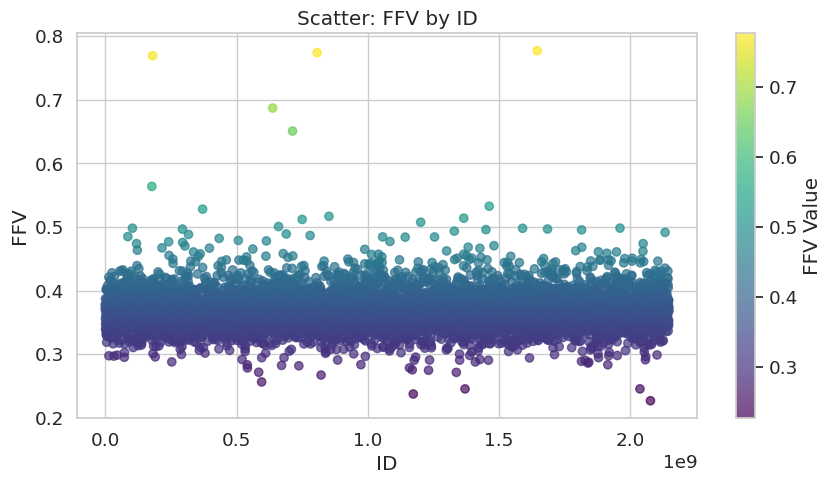

In [110]:
plt.figure(figsize=(10, 5))
plt.scatter(df_train['id'], df_train['FFV'], c=df_train['FFV'], cmap='viridis', alpha=0.7)
plt.title('Scatter: FFV by ID')
plt.xlabel('ID')
plt.ylabel('FFV')
plt.colorbar(label='FFV Value')
plt.show()


/usr/local/lib/python3.11/dist-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


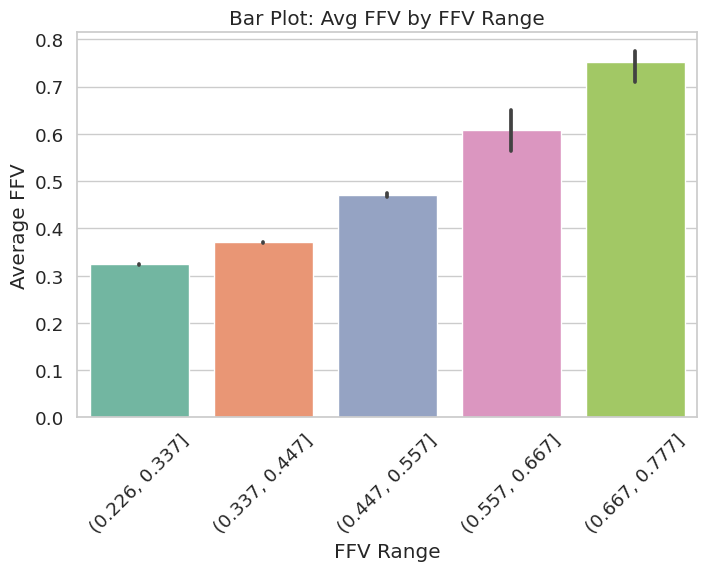

In [111]:
df_train['FFV_bin'] = pd.cut(df_train['FFV'], bins=5)

# גרף עמודות
plt.figure(figsize=(8, 5))
sns.barplot(x=df_train['FFV_bin'], y=df_train['FFV'], palette='Set2')
plt.title('Bar Plot: Avg FFV by FFV Range')
plt.xlabel('FFV Range')
plt.ylabel('Average FFV')
plt.xticks(rotation=45)
plt.show()


/tmp/ipykernel_36/3190032177.py:8: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


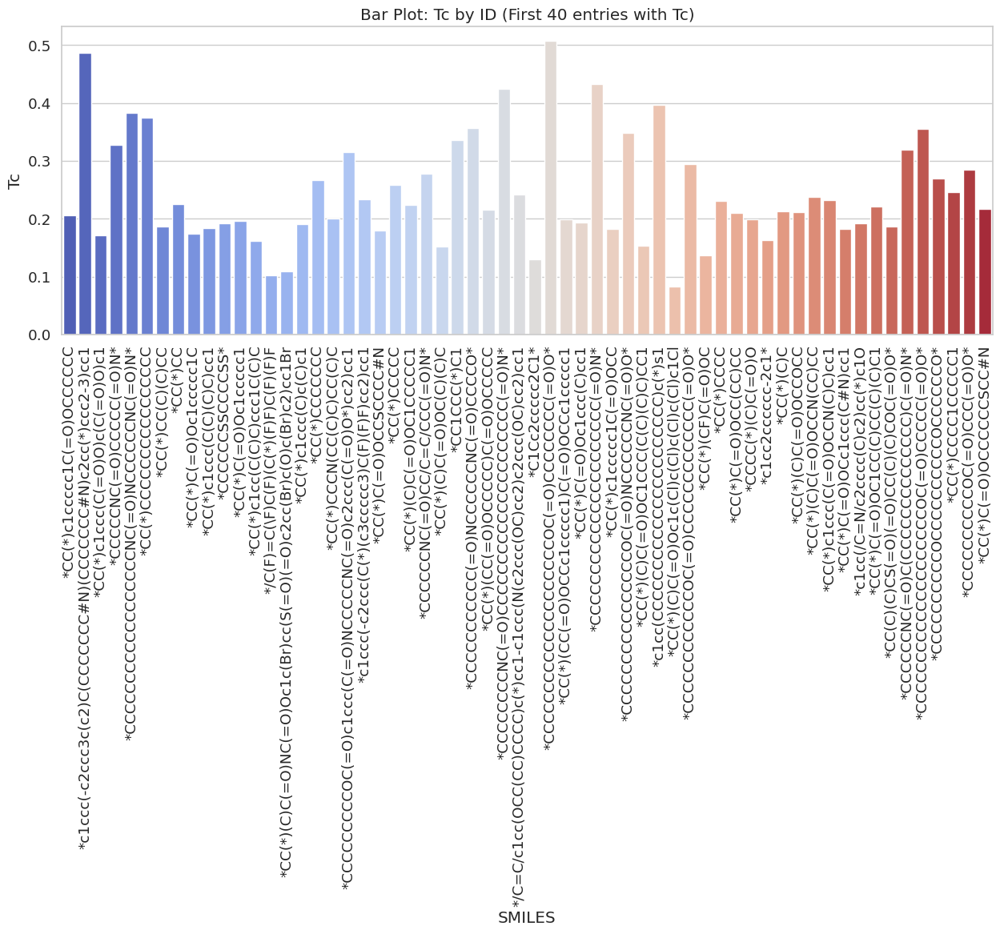

In [112]:
df_tc_notnull = df_train[df_train['Tc'].notna()]
plt.figure(figsize=(15, 5))
sns.barplot(x='SMILES', y='Tc', data=df_tc_notnull[:60], palette='coolwarm')
plt.title('Bar Plot: Tc by ID (First 40 entries with Tc)')
plt.xlabel('SMILES')
plt.ylabel('Tc')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()


In [113]:
con_data = df_train.merge(df_train_dataset_1, on='SMILES', how='outer') \
                   .merge(df_train_dataset_2, on='SMILES', how='outer') \
                   .merge(df_train_dataset_3, on='SMILES', how='outer') \
                   .merge(df_train_dataset_4, on='SMILES', how='outer')
print(con_data.shape)
print(con_data.isnull().sum())

(10396, 11)
id          2385
SMILES         0
Tg_x        9884
FFV_x       3355
Tc          9633
Density     9764
Rg          9763
FFV_bin     3355
TC_mean     9502
Tg_y       10350
FFV_y       9534
dtype: int64


In [114]:
if('Tg_y' in con_data.columns):
    con_data.drop('Tg_y', axis=1, inplace=True)
    print('Tg_y deleted')
if('Tg_x' in con_data.columns):
    con_data.drop('Tg_x', axis=1, inplace=True)
    print('Tg_x deleted')

Tg_y deleted
Tg_x deleted


In [115]:
con_data = con_data.dropna(subset=['id'])
con_data.shape

(8011, 9)

In [117]:
from rdkit import Chem
from rdkit.Chem import Descriptors, AllChem,Lipinski, rdMolDescriptors
from rdkit.Chem import Draw
from IPython.display import display
import pubchempy as pcp

In [118]:
from rdkit import Chem
from rdkit.Chem import Descriptors, Lipinski, rdMolDescriptors, Draw
import pandas as pd

def calc_features(smiles: str) -> dict:
    mol = Chem.MolFromSmiles(smiles)
    if mol is None:
        return None
    return {
        "SMILES": smiles,
        "origin": mol,  # אם לא נדרש – אפשר למחוק
        "MolWt": Descriptors.MolWt(mol),
        "NumAromaticRings": Lipinski.NumAromaticRings(mol),
        "NumRings": rdMolDescriptors.CalcNumRings(mol),
        "FractionCSP3": Descriptors.FractionCSP3(mol),
        "NumRotatableBonds": Lipinski.NumRotatableBonds(mol),
        "TPSA": Descriptors.TPSA(mol),
        "HBA": Lipinski.NumHAcceptors(mol),
        "HBD": Lipinski.NumHDonors(mol),
        "BalabanJ": Descriptors.BalabanJ(mol),
        "MolLogP": Descriptors.MolLogP(mol),
    }

# איסוף התכונות
mols = []
for i in range(df_train.shape[0]):  # או כל תחום אחר שתרצה
    smiles = df_train["SMILES"][i]
    mol_dict = calc_features(smiles)
    if mol_dict is not None:
        mols.append(mol_dict)

# הפיכה ל-DataFrame
df_features_train = pd.DataFrame(mols)

# הסרת העמודה origin אם לא דרושה בטבלה
df_features = df_features_train.drop(columns=["origin"])

# הצגה
display(df_features)
print(df_features.shape)
print(df_train.shape)

,SMILES,MolWt,NumAromaticRings,NumRings,FractionCSP3,NumRotatableBonds,TPSA,HBA,HBD,BalabanJ,MolLogP
0,*CC(*)c1ccccc1C(=O)OCCCCCC,232.323,1,1,0.533333,8,26.30,2,0,2.563477,3.98170
1,*Nc1ccc([C@H](CCC)c2ccc(C3(c4ccc([C@@H](CCC)c5...,598.919,4,5,0.441860,16,24.06,2,2,1.451540,12.35960
2,*Oc1ccc(S(=O)(=O)c2ccc(Oc3ccc(C4(c5ccc(Oc6ccc(...,1003.207,8,10,0.145161,15,122.27,9,0,0.743739,14.21700
3,*Nc1ccc(-c2c(-c3ccc(C)cc3)c(-c3ccc(C)cc3)c(N*)...,542.726,6,6,0.100000,7,24.06,2,2,1.888931,11.00768
4,*Oc1ccc(OC(=O)c2cc(OCCCCCCCCCOCC3CCCN3c3ccc([N...,965.154,4,6,0.518519,34,182.28,14,0,0.862097,11.84500
...,...,...,...,...,...,...,...,...,...,...,...
7968,*Oc1cc(CCCCCCCC)cc(OC(=O)c2cccc(C(*)=O)c2)c1,352.430,2,2,0.363636,11,52.60,4,0,2.027335,5.34140
7969,*C(=O)OCCN(CCOC(=O)c1ccc2c(c1)C(=O)N(c1cccc(N3...,750.680,5,7,0.100000,13,198.46,13,0,1.004807,6.13530
7970,*c1cc(C(=O)NCCCCCCCC)cc(N2C(=O)c3ccc(-c4ccc5c(...,521.573,3,5,0.258065,10,103.86,5,1,1.342325,4.47940
7971,*C=C(*)c1ccccc1C,116.163,1,1,0.111111,1,0.00,0,0,3.136392,2.39202


(7973, 11)
(7973, 8)


In [119]:
mol_test = []
for i in range (df_test.shape[0]):
    smiles = df_train["SMILES"][i]
    mol_dict = calc_features(smiles)
    if mol_dict is not None:
        mol_test.append(mol_dict)
# הפיכה ל-DataFrame
df_features_test = pd.DataFrame(mol_test)

# הסרת העמודה origin אם לא דרושה בטבלה
df_train_process = df_features_test.drop(columns=["origin"])

# הצגה
display(df_train_process)
print(df_train_process.shape)
print(df_test.shape)

,SMILES,MolWt,NumAromaticRings,NumRings,FractionCSP3,NumRotatableBonds,TPSA,HBA,HBD,BalabanJ,MolLogP
0,*CC(*)c1ccccc1C(=O)OCCCCCC,232.323,1,1,0.533333,8,26.30,2,0,2.563477,3.9817
1,*Nc1ccc([C@H](CCC)c2ccc(C3(c4ccc([C@@H](CCC)c5...,598.919,4,5,0.441860,16,24.06,2,2,1.451540,12.3596
2,*Oc1ccc(S(=O)(=O)c2ccc(Oc3ccc(C4(c5ccc(Oc6ccc(...,1003.207,8,10,0.145161,15,122.27,9,0,0.743739,14.2170


(3, 11)
(3, 2)


In [120]:
list_target = ['Tg','FFV','Tc','Density','Rg'] 
_df_train_ = df_train.drop(columns=['FFV_bin'])
_df_train_1 = pd.merge(_df_train_, df_features, on='SMILES')
_df_train_1

/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in greater
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()


,id,SMILES,Tg,FFV,Tc,Density,Rg,MolWt,NumAromaticRings,NumRings,FractionCSP3,NumRotatableBonds,TPSA,HBA,HBD,BalabanJ,MolLogP
0,87817,*CC(*)c1ccccc1C(=O)OCCCCCC,NaN,0.374645,0.205667,NaN,NaN,232.323,1,1,0.533333,8,26.30,2,0,2.563477,3.98170
1,106919,*Nc1ccc([C@H](CCC)c2ccc(C3(c4ccc([C@@H](CCC)c5...,NaN,0.370410,NaN,NaN,NaN,598.919,4,5,0.441860,16,24.06,2,2,1.451540,12.35960
2,388772,*Oc1ccc(S(=O)(=O)c2ccc(Oc3ccc(C4(c5ccc(Oc6ccc(...,NaN,0.378860,NaN,NaN,NaN,1003.207,8,10,0.145161,15,122.27,9,0,0.743739,14.21700
3,519416,*Nc1ccc(-c2c(-c3ccc(C)cc3)c(-c3ccc(C)cc3)c(N*)...,NaN,0.387324,NaN,NaN,NaN,542.726,6,6,0.100000,7,24.06,2,2,1.888931,11.00768
4,539187,*Oc1ccc(OC(=O)c2cc(OCCCCCCCCCOCC3CCCN3c3ccc([N...,NaN,0.355470,NaN,NaN,NaN,965.154,4,6,0.518519,34,182.28,14,0,0.862097,11.84500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7968,2146592435,*Oc1cc(CCCCCCCC)cc(OC(=O)c2cccc(C(*)=O)c2)c1,NaN,0.367498,NaN,NaN,NaN,352.430,2,2,0.363636,11,52.60,4,0,2.027335,5.34140
7969,2146810552,*C(=O)OCCN(CCOC(=O)c1ccc2c(c1)C(=O)N(c1cccc(N3...,NaN,0.353280,NaN,NaN,NaN,750.680,5,7,0.100000,13,198.46,13,0,1.004807,6.13530
7970,2147191531,*c1cc(C(=O)NCCCCCCCC)cc(N2C(=O)c3ccc(-c4ccc5c(...,NaN,0.369411,NaN,NaN,NaN,521.573,3,5,0.258065,10,103.86,5,1,1.342325,4.47940
7971,2147435020,*C=C(*)c1ccccc1C,261.662355,NaN,NaN,NaN,NaN,116.163,1,1,0.111111,1,0.00,0,0,3.136392,2.39202


In [121]:
print(f'null : {_df_train_1.isnull().sum()}')


null : id                      0
SMILES                  0
Tg                   7462
FFV                   943
Tc                   7236
Density              7360
Rg                   7359
MolWt                   0
NumAromaticRings        0
NumRings                0
FractionCSP3            0
NumRotatableBonds       0
TPSA                    0
HBA                     0
HBD                     0
BalabanJ                0
MolLogP                 0
dtype: int64


In [122]:
list_target = ['Tg', 'FFV', 'Tc', 'Density', 'Rg']

# מילונים לשמירת זוגות DataFrame
X_dict = {}
Y_dict = {}

for target in list_target:
    # בחר שורות שבהן העמודה target לא ריקה
    df_x = _df_train_1[_df_train_1[target].notnull()].copy()
    # בחר שורות שבהן העמודה target ריקה
    df_y = _df_train_1[_df_train_1[target].isnull()].copy()

    # עמודות מטרות להוציא (כל העמודות חוץ מהעמודה target)
    cols_to_drop = [col for col in list_target if col != target]

    # מחיקת העמודות שאינן העמודה target
    df_x.drop(columns=cols_to_drop, inplace=True)
    df_y.drop(columns=cols_to_drop, inplace=True)
    
    df_x.drop(columns='id', inplace=True)
    df_y.drop(columns='id', inplace=True)

    df_x.drop(columns='SMILES', inplace=True)
    df_y.drop(columns='SMILES', inplace=True)

    # שמירת התוצאות במילונים
    X_dict[f"{target}"] = df_x
    Y_dict[f"{target}"] = df_y

# דוגמה להדפסת הצורה של Tg_x ו-Tg_y
for i in list_target:
    print(i)
    print(X_dict[f'{i}'].shape)
    print(Y_dict[f'{i}'].shape)


Tg
(511, 11)
(7462, 11)
FFV
(7030, 11)
(943, 11)
Tc
(737, 11)
(7236, 11)
Density
(613, 11)
(7360, 11)
Rg
(614, 11)
(7359, 11)


In [123]:
print(X_dict['Tg'].head)

<bound method NDFrame.head of               Tg    MolWt  NumAromaticRings  NumRings  FractionCSP3  \
40    208.639749  185.183                 0         0      0.571429   
57    -41.266724  268.538                 0         0      1.000000   
63    -17.282022  138.254                 0         0      0.800000   
108     4.250403  494.588                 2         2      0.428571   
123   168.526313  466.672                 4         4      0.461538   
...          ...      ...               ...       ...           ...   
7863   38.160660  408.508                 2         2      0.200000   
7868  164.322463  274.316                 1         2      0.500000   
7889   35.475235  508.658                 3         3      0.294118   
7911   95.741049  214.261                 0         1      0.909091   
7971  261.662355  116.163                 1         1      0.111111   

      NumRotatableBonds    TPSA  HBA  HBD  BalabanJ  MolLogP  
40                    6   87.30    4    3  3.709964 -2

In [124]:
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

def train_linear_regression(df, target_col, test_size=0.3, random_state=42):
    X = df.drop(columns=[target_col])
    y = df[target_col]

    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=test_size, random_state=random_state
    )

    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    model = LinearRegression()
    model.fit(X_train_scaled, y_train)

    predict = model.predict(X_test_scaled)

    return model, predict, scaler

def train_random_forest(df, target_col, test_size=0.3, random_state=42):
    X = df.drop(columns=[target_col])
    y = df[target_col]

    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=test_size, random_state=random_state
    )

    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    model = RandomForestRegressor(random_state=random_state)
    model.fit(X_train_scaled, y_train)

    y_pred = model.predict(X_test_scaled)

    return model, y_pred, scaler

def train_gradient_boosting(df, target_col, test_size=0.3, random_state=42):
    X = df.drop(columns=[target_col])
    y = df[target_col]

    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=test_size, random_state=random_state
    )

    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    model = GradientBoostingRegressor(random_state=random_state)
    model.fit(X_train_scaled, y_train)

    y_pred = model.predict(X_test_scaled)

    return model, y_pred, scaler

def train_svr(df, target_col, test_size=0.3, random_state=42):
    X = df.drop(columns=[target_col])
    y = df[target_col]

    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=test_size, random_state=random_state
    )

    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    model = SVR()
    model.fit(X_train_scaled, y_train)

    y_pred = model.predict(X_test_scaled)

    return model, y_pred, scaler 




In [125]:
list_target

['Tg', 'FFV', 'Tc', 'Density', 'Rg']

In [126]:
models = []
scalers = []
list_pred = []



for i in list_target:
    model_lr,predict_lr,scaler_lr = train_linear_regression(X_dict[i],i)
    
    model_rf,predict_rf,scaler_rf= train_random_forest(X_dict[i], i)
    
    
    model_gb,predict_gb,scaler_gb= train_gradient_boosting(X_dict[i],i)
    
    
    model_svr,predict_svr,scaler_svr= train_svr(X_dict[i], i)

    print("="*50)
    print(f"📈 Linear Regression - מספר תחזיות: {len(predict_lr)} 📊")
    print(f"🌲 Random Forest - מספר תחזיות: {len(predict_rf)} 🌳")
    print(f"🚀 Gradient Boosting - מספר תחזיות: {len(predict_gb)} ⚡")
    print(f"🎯 SVR (Support Vector Regression) - מספר תחזיות: {len(predict_svr)} 🤖")
    print("="*50)

    list_pred.append(({
        
            'linear_regression': predict_lr,
            'random_forest': predict_rf,
            'gradient_boosting': predict_gb,
            'svr': predict_svr
        
    }))
    models.append(({
        
            'linear_regression': model_lr,
            'random_forest': model_rf,
            'gradient_boosting': model_gb,
            'svr': model_svr
        
    }))
    scalers.append(({
        
            'linear_regression': scaler_lr,
            'random_forest': scaler_rf,
            'gradient_boosting': scaler_gb,
            'svr': scaler_svr
        
    }))

📈 Linear Regression - מספר תחזיות: 154 📊
🌲 Random Forest - מספר תחזיות: 154 🌳
🚀 Gradient Boosting - מספר תחזיות: 154 ⚡
🎯 SVR (Support Vector Regression) - מספר תחזיות: 154 🤖
📈 Linear Regression - מספר תחזיות: 2109 📊
🌲 Random Forest - מספר תחזיות: 2109 🌳
🚀 Gradient Boosting - מספר תחזיות: 2109 ⚡
🎯 SVR (Support Vector Regression) - מספר תחזיות: 2109 🤖
📈 Linear Regression - מספר תחזיות: 222 📊
🌲 Random Forest - מספר תחזיות: 222 🌳
🚀 Gradient Boosting - מספר תחזיות: 222 ⚡
🎯 SVR (Support Vector Regression) - מספר תחזיות: 222 🤖
📈 Linear Regression - מספר תחזיות: 184 📊
🌲 Random Forest - מספר תחזיות: 184 🌳
🚀 Gradient Boosting - מספר תחזיות: 184 ⚡
🎯 SVR (Support Vector Regression) - מספר תחזיות: 184 🤖
📈 Linear Regression - מספר תחזיות: 185 📊
🌲 Random Forest - מספר תחזיות: 185 🌳
🚀 Gradient Boosting - מספר תחזיות: 185 ⚡
🎯 SVR (Support Vector Regression) - מספר תחזיות: 185 🤖


In [127]:
try:
    df_1 = pd.DataFrame({k: list_pred[0][k] for k in list(list_pred[0].keys())[0:4]})
    df_2 = pd.DataFrame({k: list_pred[1][k] for k in list(list_pred[1].keys())[0:4]})
    df_3 = pd.DataFrame({k: list_pred[2][k] for k in list(list_pred[2].keys())[0:4]})
    df_4 = pd.DataFrame({k: list_pred[3][k] for k in list(list_pred[3].keys())[0:4]})
    df_5 = pd.DataFrame({k: list_pred[4][k] for k in list(list_pred[4].keys())[0:4]})
except Exception as e:
    df_1 = pd.DataFrame({k: list_pred[0][k] for k in list(list_pred[0].keys())[0:3]})
    df_2 = pd.DataFrame({k: list_pred[1][k] for k in list(list_pred[1].keys())[0:3]})
    df_3 = pd.DataFrame({k: list_pred[2][k] for k in list(list_pred[2].keys())[0:3]})
    df_4 = pd.DataFrame({k: list_pred[3][k] for k in list(list_pred[3].keys())[0:3]})
    df_5 = pd.DataFrame({k: list_pred[4][k] for k in list(list_pred[4].keys())[0:3]})


In [128]:
df_1.describe()

,linear_regression,random_forest,gradient_boosting,svr
count,154.000000,154.000000,154.000000,154.000000
mean,97.778476,93.413807,94.034126,77.752539
std,84.744824,78.412473,82.848103,18.275297
min,-104.759511,-75.023330,-72.662651,43.743658
25%,38.734369,37.736841,31.657798,64.167611
50%,92.105229,89.937943,88.541959,78.476447
75%,137.617924,151.758862,143.673848,92.349724
max,380.328976,415.098970,406.660774,113.315986


In [129]:
df_2.describe()

,linear_regression,random_forest,gradient_boosting,svr
count,2109.000000,2109.000000,2109.000000,2109.000000
mean,0.366922,0.366964,0.367091,0.405031
std,0.015866,0.022640,0.019186,0.013955
min,0.260828,0.289157,0.295737,0.341245
25%,0.358083,0.352913,0.355334,0.396029
50%,0.367730,0.364208,0.365875,0.401866
75%,0.376034,0.379596,0.377380,0.412175
max,0.430533,0.464291,0.466318,0.470989


In [130]:
df_3.describe()

,linear_regression,random_forest,gradient_boosting,svr
count,222.000000,222.000000,222.000000,222.000000
mean,0.253761,0.251261,0.251215,0.265584
std,0.079289,0.077800,0.076746,0.056639
min,0.007337,0.083345,0.081113,0.168813
25%,0.200062,0.186521,0.186194,0.216021
50%,0.241192,0.229483,0.227602,0.250603
75%,0.312463,0.324768,0.332930,0.315504
max,0.493743,0.415433,0.436637,0.375342


In [131]:
df_4.describe()

,linear_regression,random_forest,gradient_boosting,svr
count,184.000000,184.000000,184.000000,184.000000
mean,0.982898,0.994083,0.990206,1.004209
std,0.109994,0.126524,0.134884,0.117853
min,0.708201,0.787152,0.787690,0.771286
25%,0.910485,0.894712,0.899077,0.933652
50%,0.973308,0.982005,0.961638,1.003538
75%,1.044294,1.063407,1.056919,1.067653
max,1.450802,1.443380,1.542674,1.503268


In [132]:
df_5.describe()

,linear_regression,random_forest,gradient_boosting,svr
count,185.000000,185.000000,185.000000,185.000000
mean,16.245141,16.578238,16.549814,15.655476
std,2.240079,3.254425,3.265883,2.832677
min,12.719684,11.118546,11.165478,11.275574
25%,14.509141,13.727602,13.726993,13.237166
50%,15.399182,16.013609,15.668419,14.577159
75%,17.741471,19.281110,19.338740,18.113839
max,23.130864,23.672922,23.848654,21.720052


In [133]:
#list_target = ['Tg', 'FFV', 'Tc', 'Density', 'Rg']
df_final_pred = df_features_train.copy()
df_final_pred_lr = df_features_train.copy()
df_final_pred_rf = df_features_train.copy()
df_final_pred_gb = df_features_train.copy()


pdFrameForPred = pd.DataFrame(df_features_train.drop(columns=['SMILES']))
pdFrameForPred = pd.DataFrame(pdFrameForPred.drop(columns=['origin']))

In [134]:
pdFrameForPred.head()

,MolWt,NumAromaticRings,NumRings,FractionCSP3,NumRotatableBonds,TPSA,HBA,HBD,BalabanJ,MolLogP
0,232.323,1,1,0.533333,8,26.30,2,0,2.563477,3.98170
1,598.919,4,5,0.441860,16,24.06,2,2,1.451540,12.35960
2,1003.207,8,10,0.145161,15,122.27,9,0,0.743739,14.21700
3,542.726,6,6,0.100000,7,24.06,2,2,1.888931,11.00768
4,965.154,4,6,0.518519,34,182.28,14,0,0.862097,11.84500


In [135]:
list_target = ['Tg', 'FFV', 'Tc', 'Density', 'Rg']
# יוצרים מטריצת פיצ'רים עבור ניבוי
X_pred = pdFrameForPred

# מבצעים ניבוי על כל הדוגמאות

for i,name in enumerate(list_target):    
    df_final_pred[f'{name}_prediction'] = models[i]['svr'].predict(scalers[0]['svr'].fit_transform(X_pred))
    df_final_pred_lr[f'{name}_prediction'] = models[i]['linear_regression'].predict(scalers[0]['svr'].fit_transform(X_pred))
    df_final_pred_rf[f'{name}_prediction'] = models[i]['random_forest'].predict(scalers[0]['svr'].fit_transform(X_pred))
    df_final_pred_gb[f'{name}_prediction'] = models[i]['gradient_boosting'].predict(scalers[0]['svr'].fit_transform(X_pred))



In [136]:
pdFrameForPred.describe()

,MolWt,NumAromaticRings,NumRings,FractionCSP3,NumRotatableBonds,TPSA,HBA,HBD,BalabanJ,MolLogP
count,7973.000000,7973.000000,7973.000000,7973.000000,7973.000000,7973.000000,7973.000000,7973.000000,7973.000000,7973.000000
mean,442.483920,3.038003,3.674652,0.342673,9.006397,66.111084,4.414649,0.872445,1.999309,5.572282
std,239.991773,2.625130,3.081068,0.319564,6.465652,47.088447,2.920745,1.245024,0.969227,3.702220
min,14.027000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.465308,-4.822900
25%,258.409000,1.000000,1.000000,0.060606,5.000000,26.300000,2.000000,0.000000,1.273079,2.904340
50%,406.357000,3.000000,3.000000,0.250000,7.000000,58.200000,4.000000,0.000000,1.781662,5.048500
75%,580.643000,4.000000,6.000000,0.533333,12.000000,95.120000,6.000000,2.000000,2.524075,7.458800
max,2202.482000,16.000000,18.000000,1.000000,92.000000,437.260000,45.000000,9.000000,7.414613,31.011400


In [137]:
df_final_pred.filter(like='prediction')

,Tg_prediction,FFV_prediction,Tc_prediction,Density_prediction,Rg_prediction
0,54.673404,0.421616,0.281109,0.847131,12.579577
1,76.795466,0.396390,0.336103,0.911690,16.652184
2,96.902873,0.394793,0.309110,1.072107,19.644219
3,95.806573,0.395347,0.254884,1.024027,15.862900
4,80.493989,0.394635,0.300413,1.092157,18.938816
...,...,...,...,...,...
7968,61.905603,0.406165,0.303824,0.874656,12.217546
7969,92.993759,0.397579,0.263229,1.201332,16.781053
7970,89.231877,0.409183,0.287939,0.987954,13.718949
7971,77.634445,0.449459,0.210319,0.951364,16.836104


In [138]:
df_final_pred.filter(like='prediction').describe()

,Tg_prediction,FFV_prediction,Tc_prediction,Density_prediction,Rg_prediction
count,7973.000000,7973.000000,7973.000000,7973.000000,7973.000000
mean,80.122984,0.404735,0.270197,1.019980,15.565443
std,18.126956,0.014504,0.038657,0.088463,2.201973
min,44.368625,0.328304,0.184374,0.771159,10.422088
25%,64.066828,0.395971,0.240126,0.957234,13.897384
50%,80.726456,0.401331,0.267115,1.019403,15.304692
75%,95.666040,0.411488,0.297170,1.075526,17.107866
max,114.902534,0.475612,0.382237,1.376001,21.690824


In [139]:
df_final_pred_lr.filter(like='prediction')

,Tg_prediction,FFV_prediction,Tc_prediction,Density_prediction,Rg_prediction
0,27.964224,0.370971,0.268903,0.905057,14.869771
1,93.019558,0.380748,0.387818,0.744782,17.623701
2,175.971234,0.389175,0.272862,0.992707,16.790667
3,182.722809,0.381497,0.238684,0.889789,14.360271
4,-23.935131,0.354066,0.574386,0.777169,26.300261
...,...,...,...,...,...
7968,34.888466,0.368738,0.295383,0.917036,16.188950
7969,118.106066,0.350463,0.256771,1.115302,17.738538
7970,138.436966,0.362860,0.273712,1.031923,18.017329
7971,103.946169,0.371121,0.153373,1.011310,11.971490


In [140]:
df_final_pred_rf.filter(like='prediction')

,Tg_prediction,FFV_prediction,Tc_prediction,Density_prediction,Rg_prediction
0,16.457762,0.377256,0.301049,0.911988,14.046211
1,63.598031,0.371448,0.374029,0.895419,15.087833
2,155.669772,0.374920,0.326998,0.972826,22.976168
3,202.745287,0.380904,0.241408,1.006114,19.099404
4,37.630825,0.355087,0.367863,0.936472,19.086755
...,...,...,...,...,...
7968,9.660039,0.369347,0.323618,0.930765,17.554653
7969,127.759434,0.362563,0.258557,1.075922,16.169072
7970,93.424571,0.364265,0.293033,0.959663,14.628455
7971,157.910900,0.406251,0.186513,0.876247,19.369789


In [141]:
df_final_pred_gb.filter(like='prediction')

,Tg_prediction,FFV_prediction,Tc_prediction,Density_prediction,Rg_prediction
0,13.137825,0.372567,0.309701,0.900668,13.355443
1,20.936556,0.377239,0.374853,0.898358,14.402755
2,142.949626,0.376634,0.310046,0.981163,23.600333
3,186.767186,0.376880,0.221986,0.954441,17.969609
4,13.994281,0.363496,0.364952,0.949915,15.975774
...,...,...,...,...,...
7968,20.244852,0.359684,0.333910,0.921040,16.981079
7969,135.369961,0.363356,0.263394,1.031787,15.828385
7970,112.716864,0.356072,0.274178,0.949597,19.161223
7971,182.879827,0.399634,0.176059,0.838361,19.910443


In [142]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.cluster import AgglomerativeClustering

def create_hierarchical_clustered_scatterplot(df, x, y, n_clusters=3, show_fit_line=True):
    # סינון רק שני העמודות
    data = df[[x, y]].dropna()

    # קלאסטרינג היררכי
    clustering = AgglomerativeClustering(n_clusters=n_clusters)
    data['cluster'] = clustering.fit_predict(data[[x, y]])

    # ציור Scatter עם הצבעה לפי אשכול
    plt.figure(figsize=(10, 7))
    sns.scatterplot(data=data, x=x, y=y, hue='cluster', palette='Set1', s=60)

    if show_fit_line:
        # מוסיפים קו רגרסיה לכל אשכול
        for cluster_id in range(n_clusters):
            cluster_data = data[data['cluster'] == cluster_id]
            if len(cluster_data) >= 2:
                coeffs = np.polyfit(cluster_data[x], cluster_data[y], deg=1)
                poly_line = np.poly1d(coeffs)
                xs = np.linspace(cluster_data[x].min(), cluster_data[x].max(), 100)
                ys = poly_line(xs)
                plt.plot(xs, ys, label=f'Fit Cluster {cluster_id}', linestyle='--')

    plt.title(f'Hierarchical Clustering: {x} vs {y}')
    plt.legend()
    plt.tight_layout()
    plt.show()


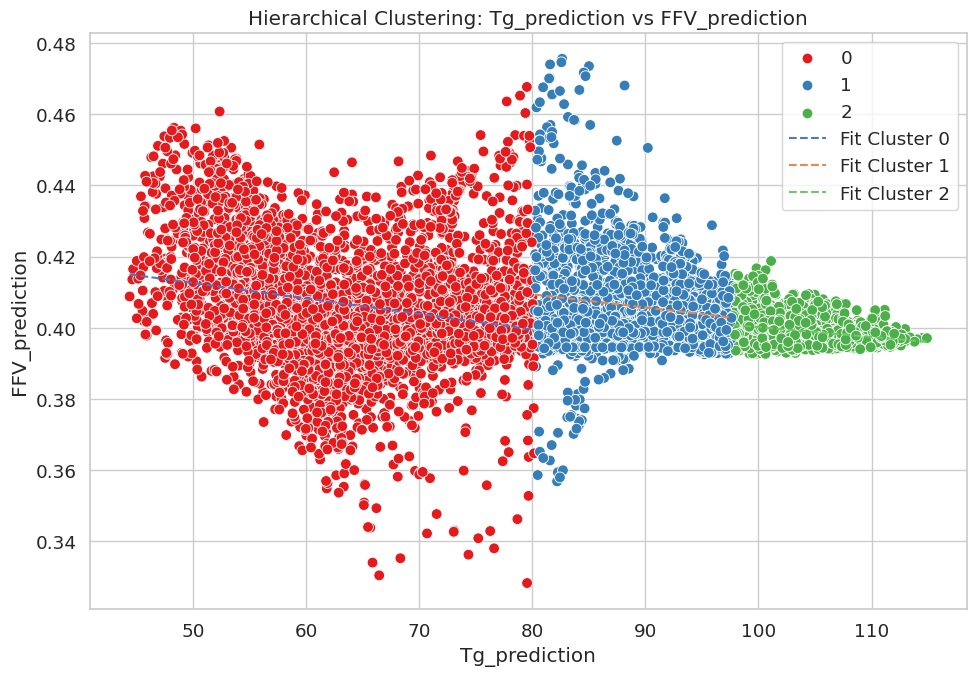

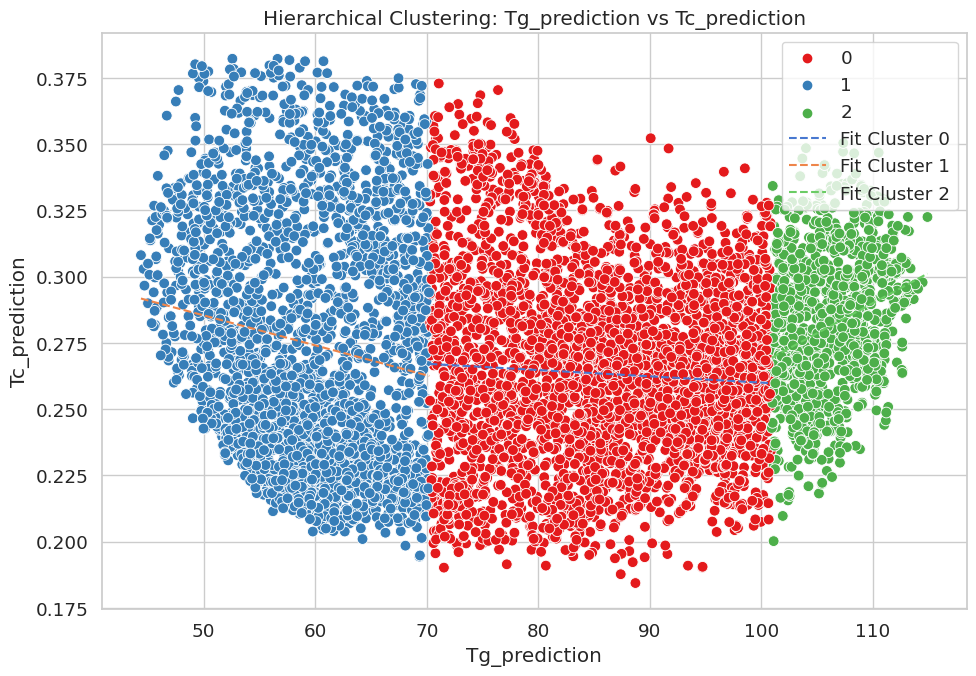

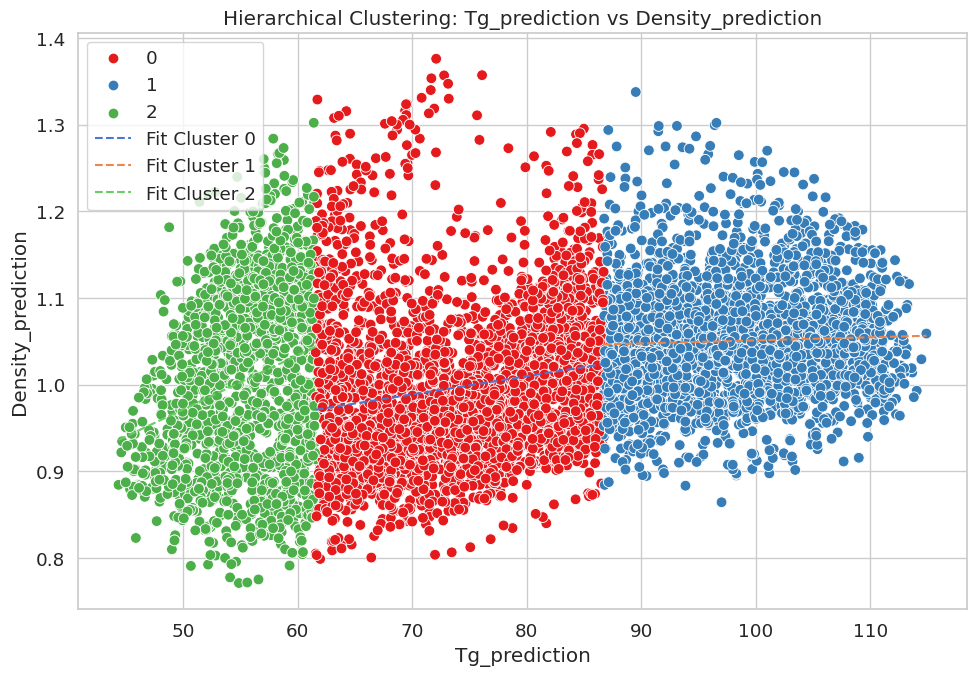

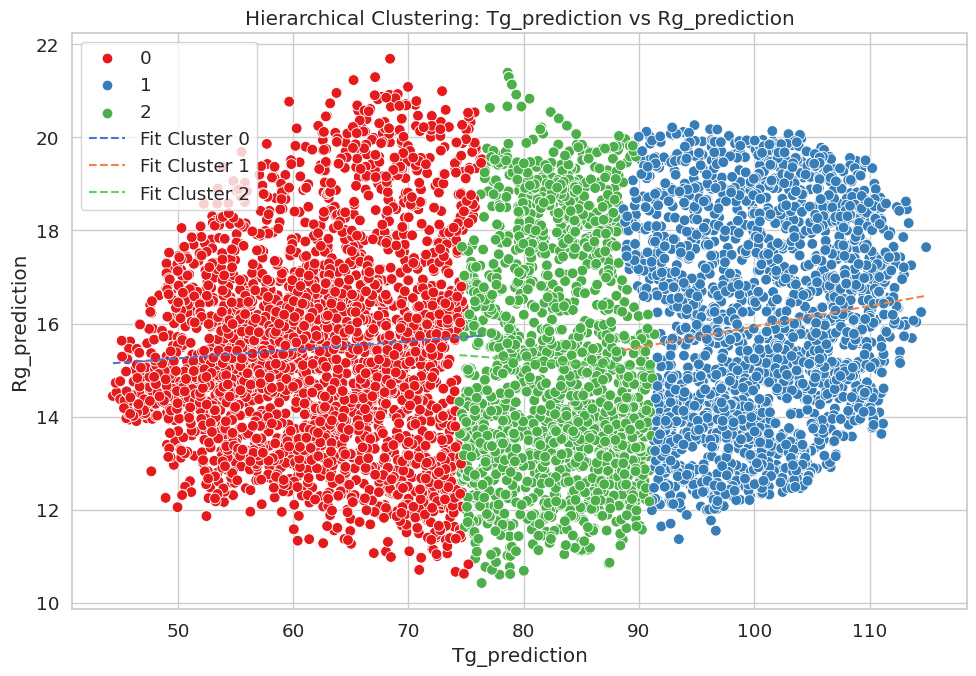

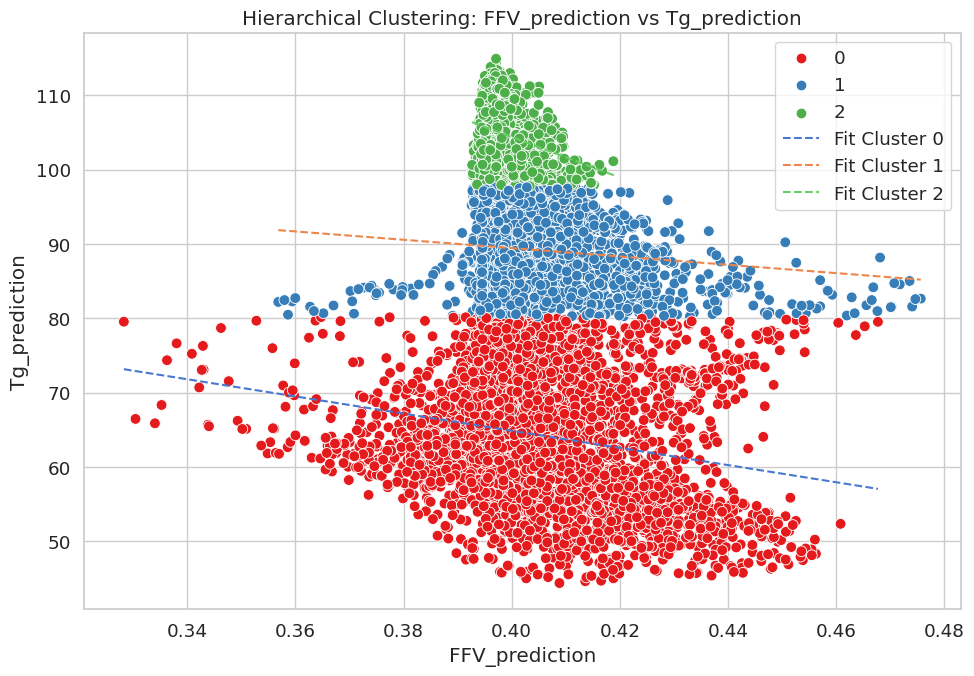

...

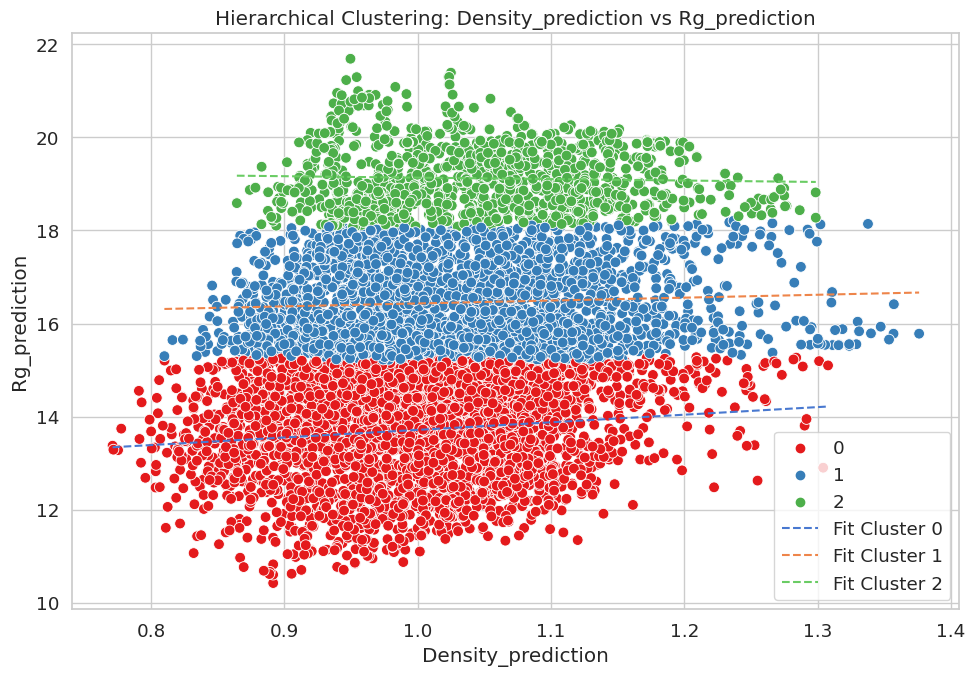

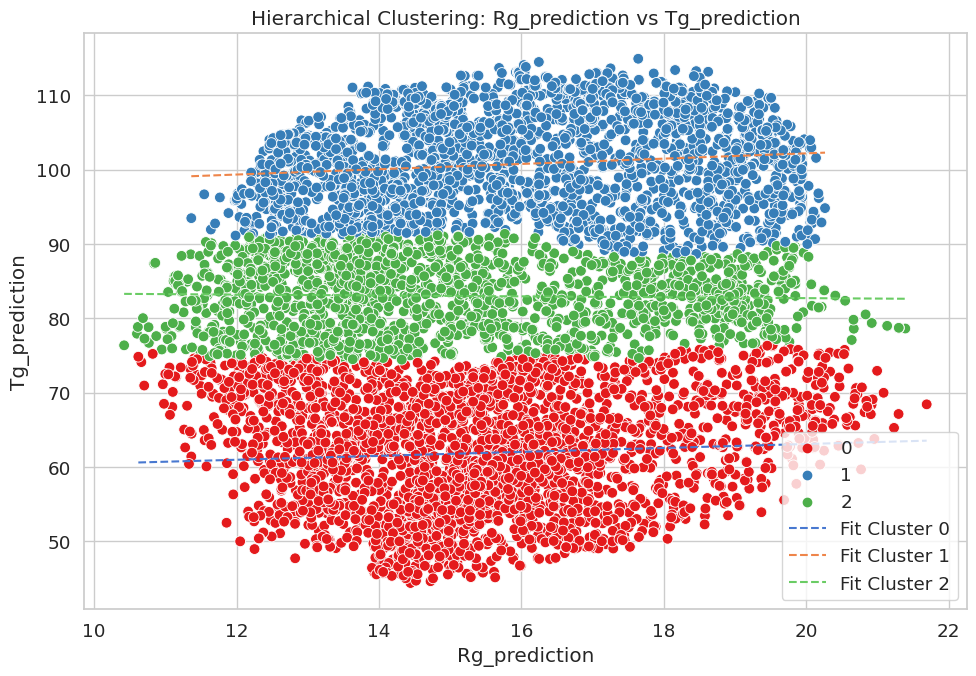

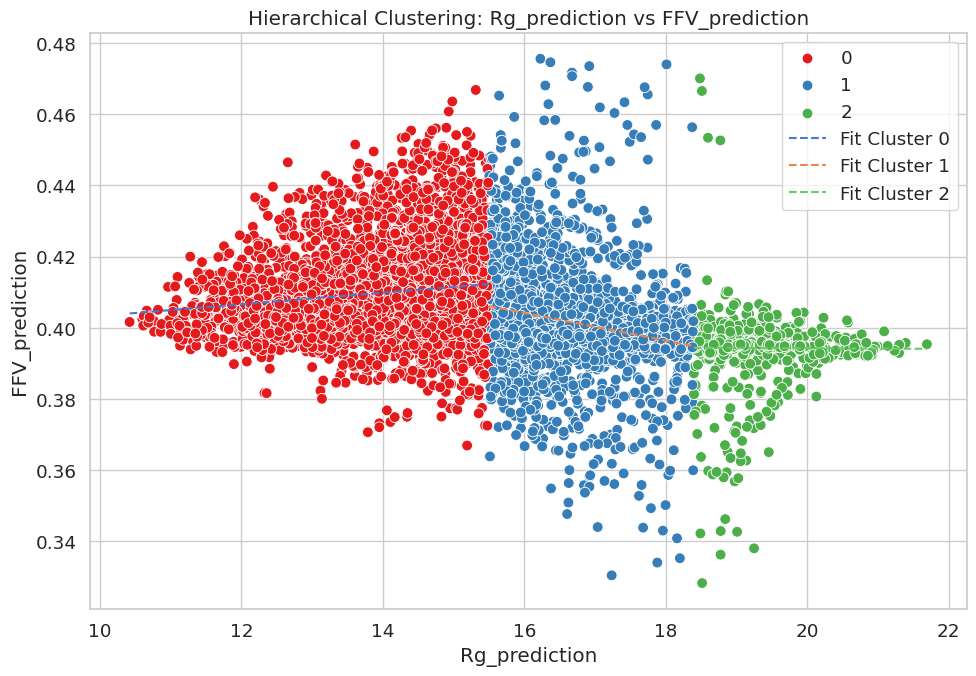

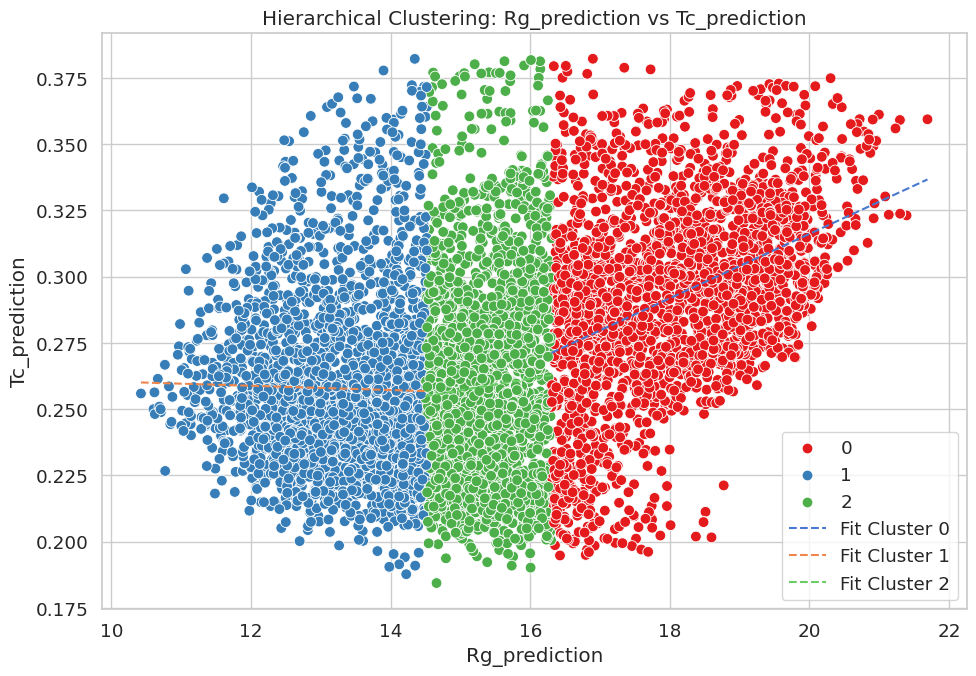

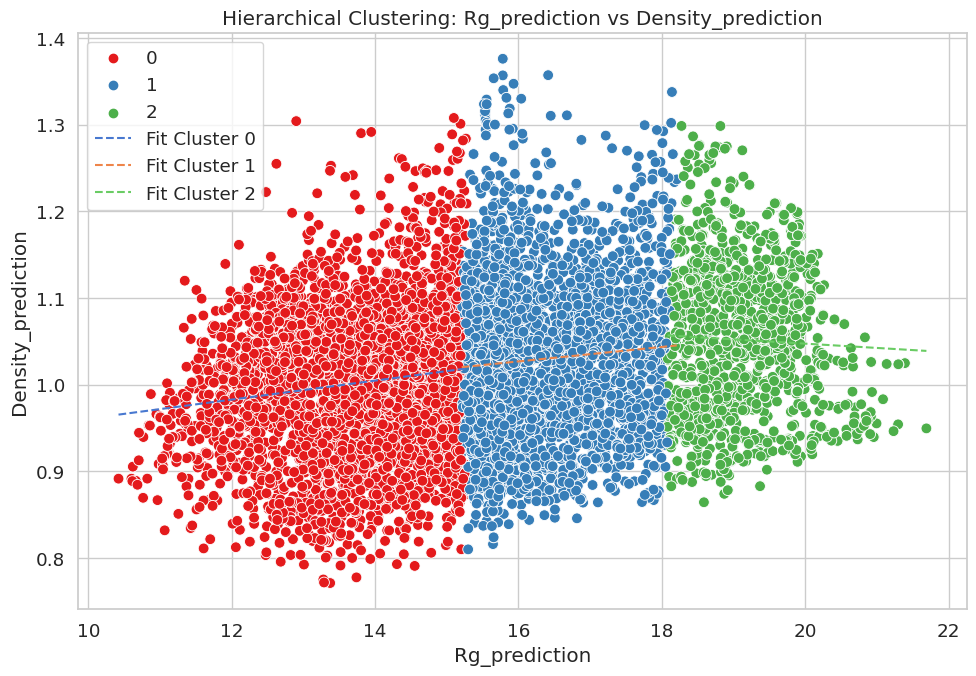

In [143]:
m = 0
for i in df_final_pred.filter(like='prediction').columns:
    for j in df_final_pred.filter(like='prediction').columns:
        m+=1
        if i != j:  # אם לא רוצים זוגות זהים
            create_hierarchical_clustered_scatterplot(df_final_pred, i, j)
        if i=='TC_prediction' and j=='Density_prediction':
            print(f'🎨 🌠 - {m} Scatter + hierarchical Clustering + poly1d Plots ')
            break
        
            

In [144]:
'''
id,Tg,FFV,Tc,Density,Rg
   2112371,0.0,0.0,0.0,0.0,0.0
   2021324,0.0,0.0,0.0,0.0,0.0
   343242,0.0,0.0,0.0,0.0,0.0
'''

'\nid,Tg,FFV,Tc,Density,Rg\n   2112371,0.0,0.0,0.0,0.0,0.0\n   2021324,0.0,0.0,0.0,0.0,0.0\n   343242,0.0,0.0,0.0,0.0,0.0\n'

In [145]:
list_target = ['Tg', 'FFV', 'Tc', 'Density', 'Rg']
# יוצרים מטריצת פיצ'רים עבור ניבוי
df_t_pred = df_features_train.copy()
df_t_pred_lr = df_features_train.copy()
df_t_pred_rf = df_features_train.copy()
df_t_pred_gb = df_features_train.copy()

X_t_pred = df_train_process.drop(columns=['SMILES'])
predictionS = [X_t_pred.copy() for _ in range(len(list_target))]

# ניבוי לפי המודלים
for i, name in enumerate(list_target):    
    predictionS[i][f'{name}_prediction_svr'] = models[i]['svr'].predict(scalers[i]['svr'].fit_transform(X_t_pred))
    predictionS[i][f'{name}_prediction_lr'] = models[i]['linear_regression'].predict(scalers[i]['linear_regression'].fit_transform(X_t_pred))
    predictionS[i][f'{name}_prediction_rf'] = models[i]['random_forest'].predict(scalers[i]['random_forest'].fit_transform(X_t_pred))
    predictionS[i][f'{name}_prediction_gb'] = models[i]['gradient_boosting'].predict(scalers[i]['gradient_boosting'].fit_transform(X_t_pred))

In [146]:
predictionS[0]

,MolWt,NumAromaticRings,NumRings,FractionCSP3,NumRotatableBonds,TPSA,HBA,HBD,BalabanJ,MolLogP,Tg_prediction_svr,Tg_prediction_lr,Tg_prediction_rf,Tg_prediction_gb
0,232.323,1,1,0.533333,8,26.30,2,0,2.563477,3.9817,62.934594,39.337296,53.301372,74.228775
1,598.919,4,5,0.441860,16,24.06,2,2,1.451540,12.3596,67.858314,96.401626,40.861871,5.989462
2,1003.207,8,10,0.145161,15,122.27,9,0,0.743739,14.2170,106.240557,164.064205,184.324524,76.302524


In [147]:
for i in range(len(predictionS)):
    predictionS[i] = predictionS[i].iloc[:, -4:]


In [148]:
predictionS[0].describe()

,Tg_prediction_svr,Tg_prediction_lr,Tg_prediction_rf,Tg_prediction_gb
count,3.000000,3.000000,3.000000,3.000000
mean,79.011155,99.934376,92.829256,52.173587
std,23.709513,62.438455,79.480963,40.010063
min,62.934594,39.337296,40.861871,5.989462
25%,65.396454,67.869461,47.081621,40.109119
50%,67.858314,96.401626,53.301372,74.228775
75%,87.049436,130.232915,118.812948,75.265650
max,106.240557,164.064205,184.324524,76.302524


In [149]:
predictionS[1].describe()

,FFV_prediction_svr,FFV_prediction_lr,FFV_prediction_rf,FFV_prediction_gb
count,3.000000,3.000000,3.000000,3.000000
mean,0.392747,0.366947,0.358876,0.370040
std,0.019815,0.003830,0.008822,0.002556
min,0.371023,0.363859,0.348824,0.367494
25%,0.384206,0.364804,0.355647,0.368757
50%,0.397388,0.365749,0.362470,0.370021
75%,0.403609,0.368490,0.363902,0.371313
max,0.409829,0.371232,0.365334,0.372606


In [150]:
predictionS[2].describe()

,Tc_prediction_svr,Tc_prediction_lr,Tc_prediction_rf,Tc_prediction_gb
count,3.000000,3.000000,3.000000,3.000000
mean,0.279726,0.259266,0.252935,0.249153
std,0.068897,0.131865,0.102143,0.130458
min,0.202644,0.123201,0.144967,0.104170
25%,0.251932,0.195657,0.205386,0.195200
50%,0.301221,0.268112,0.265805,0.286231
75%,0.318267,0.327298,0.306919,0.321644
max,0.335313,0.386484,0.348033,0.357058


In [151]:
predictionS[3].describe()

,Density_prediction_svr,Density_prediction_lr,Density_prediction_rf,Density_prediction_gb
count,3.000000,3.000000,3.000000,3.000000
mean,1.055670,0.977557,1.059733,1.020024
std,0.159241,0.154787,0.138435,0.094141
min,0.877931,0.803382,0.906220,0.917814
25%,0.990837,0.916647,1.002057,0.978444
50%,1.103744,1.029913,1.097894,1.039073
75%,1.144539,1.064645,1.136489,1.071128
max,1.185335,1.099377,1.175084,1.103183


In [152]:
predictionS[4].describe()

,Rg_prediction_svr,Rg_prediction_lr,Rg_prediction_rf,Rg_prediction_gb
count,3.000000,3.000000,3.000000,3.000000
mean,16.772919,16.341423,19.040942,18.258385
std,0.933597,4.376882,2.177217,2.047809
min,16.090699,11.462518,16.734372,16.758281
25%,16.240931,14.550663,18.031264,17.091875
50%,16.391162,17.638808,19.328155,17.425469
75%,17.114029,18.780875,20.194226,19.008437
max,17.836895,19.922942,21.060297,20.591405


In [153]:
for i in range(5):
    predictionS[i]['id'] = df_test['id']
predictionS[0]

,Tg_prediction_svr,Tg_prediction_lr,Tg_prediction_rf,Tg_prediction_gb,id
0,62.934594,39.337296,53.301372,74.228775,1109053969
1,67.858314,96.401626,40.861871,5.989462,1422188626
2,106.240557,164.064205,184.324524,76.302524,2032016830


In [154]:
dictFinal = {}
dictFinal['id'] = df_test['id']
for i,target in enumerate(list_target):
    dictFinal[target]=predictionS[i][f'{target}_prediction_svr']

In [155]:
dictFinal

{'id': 0    1109053969
 1    1422188626
 2    2032016830
 Name: id, dtype: int64,
 'Tg': 0     62.934594
 1     67.858314
 2    106.240557
 Name: Tg_prediction_svr, dtype: float64,
 'FFV': 0    0.371023
 1    0.409829
 2    0.397388
 Name: FFV_prediction_svr, dtype: float64,
 'Tc': 0    0.202644
 1    0.335313
 2    0.301221
 Name: Tc_prediction_svr, dtype: float64,
 'Density': 0    1.185335
 1    0.877931
 2    1.103744
 Name: Density_prediction_svr, dtype: float64,
 'Rg': 0    16.391162
 1    16.090699
 2    17.836895
 Name: Rg_prediction_svr, dtype: float64}

In [156]:
submission = pd.DataFrame(dictFinal)
submission.to_csv('submission.csv',index=False)

submission


,id,Tg,FFV,Tc,Density,Rg
0,1109053969,62.934594,0.371023,0.202644,1.185335,16.391162
1,1422188626,67.858314,0.409829,0.335313,0.877931,16.090699
2,2032016830,106.240557,0.397388,0.301221,1.103744,17.836895
